# RECOLECCION DE DATOS Y LIMPIEZA DE DATOS

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt    
import seaborn as sn 

In [2]:
df = pd.read_csv('diabetes_prediction_dataset.csv')

In [3]:
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,Female,80.0,0,0,No Info,27.32,6.2,90,0
99996,Female,2.0,0,0,No Info,17.37,6.5,100,0
99997,Male,66.0,0,0,former,27.83,5.7,155,0
99998,Female,24.0,0,0,never,35.42,4.0,100,0


#### Info de la data

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   smoking_history      100000 non-null  object 
 5   bmi                  100000 non-null  float64
 6   HbA1c_level          100000 non-null  float64
 7   blood_glucose_level  100000 non-null  int64  
 8   diabetes             100000 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 6.9+ MB


In [5]:
df.isna().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64

#### Podemso ver que no hay nulos, sin embargo podemos tener valores de 0 en nuestras columnas y estos se impretarian como si fueran nulos. Asi que contaremos si es que hay 0 en las columnas donde no deberian haber 0 y si las hay cambiaremos 0 por nulo

* Cols guardara las columnas que no deberian tener 0

In [6]:
cols = ['bmi', 'HbA1c_level', 'blood_glucose_level', 'age']
zero_counts = (df[cols] == 0).sum()
print(zero_counts)

bmi                    0
HbA1c_level            0
blood_glucose_level    0
age                    0
dtype: int64


* Increiblemente este dataset es super limpio !! no tiene nulos. Ya que si hacemos conteo de nulos es igual a 0 y si contamos si es que hay valores de 0, en las columnas que no deberian tener 0, tambien nos da 0!!.

### Eliminacion de columnas irrelevantes


In [7]:
df_cleaned = df.copy()

In [8]:
df_cleaned.smoking_history.value_counts()

smoking_history
No Info        35816
never          35095
former          9352
current         9286
not current     6447
ever            4004
Name: count, dtype: int64

#### Eliminaremos smoking history, podemos ver que la columna tiene muchas variables y si bien podriamos categorizarlas entre si o no con feature engineering estas pueden introdir sesgo, sobre todo valores que son 'No info'. El objetivo del proyecto es ser certeros en cuanto a las variables que influyen a la diabetes, en otras palabras un enfoque mas cientifico.

In [9]:
df_cleaned.drop(columns=["smoking_history"], inplace=True)

In [10]:
df_cleaned

,gender,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,25.19,6.6,140,0
1,Female,54.0,0,0,27.32,6.6,80,0
2,Male,28.0,0,0,27.32,5.7,158,0
3,Female,36.0,0,0,23.45,5.0,155,0
4,Male,76.0,1,1,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...
99995,Female,80.0,0,0,27.32,6.2,90,0
99996,Female,2.0,0,0,17.37,6.5,100,0
99997,Male,66.0,0,0,27.83,5.7,155,0
99998,Female,24.0,0,0,35.42,4.0,100,0


#### Ya elimanos las columnas innecesarias (smoking_history). Veamos la informacion de nuestra df 

In [11]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   bmi                  100000 non-null  float64
 5   HbA1c_level          100000 non-null  float64
 6   blood_glucose_level  100000 non-null  int64  
 7   diabetes             100000 non-null  int64  
dtypes: float64(3), int64(4), object(1)
memory usage: 6.1+ MB


#### Super, no tenemos columnas innecesarias. Pasemos al Analisis Exploratorio

## ------------------------------------------------------------------------------------------

## Analisis exploratorio

### Graficos de cajas y bigotes de las variables: 'bmi', 'HbA1c_level', 'blood_glucose_level', 'age'. 

- edad

<Axes: >

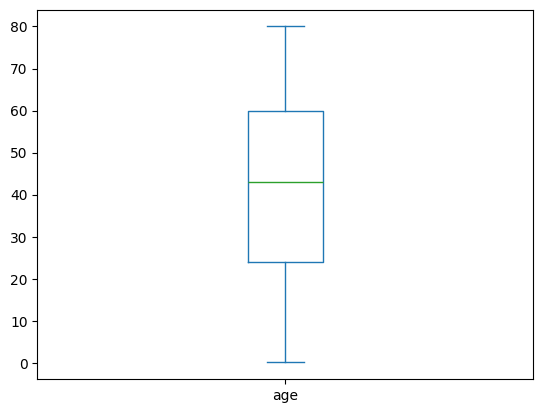

In [12]:
df_cleaned['age'].plot(kind = 'box')

- bmi

<Axes: >

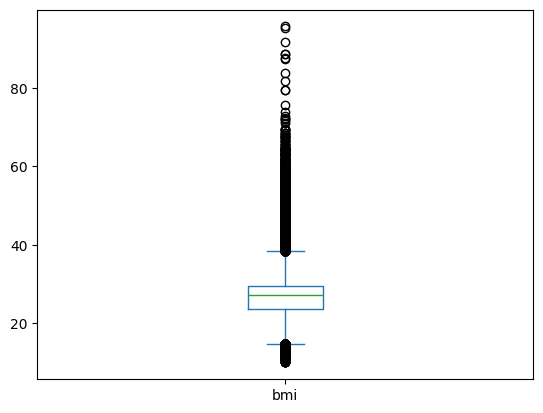

In [14]:
df_cleaned['bmi'].plot(kind = 'box')

- hb41c_level

<Axes: >

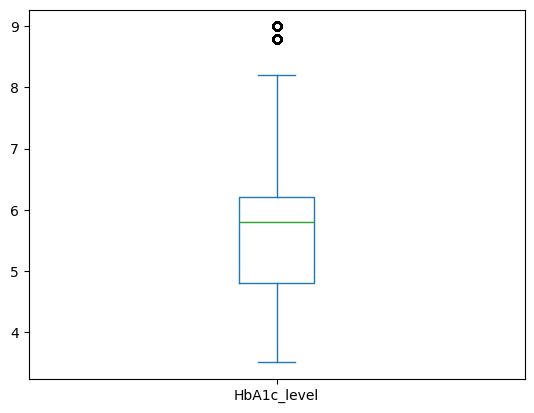

In [15]:
df_cleaned['HbA1c_level'].plot(kind = 'box')

- blood_glucose_level

<Axes: >

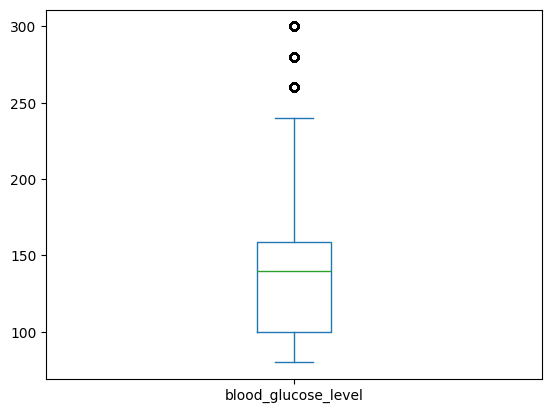

In [16]:
df_cleaned['blood_glucose_level'].plot(kind = 'box')

### Diabetes y genero

In [17]:
df_cleaned.gender.value_counts()

gender
Female    58552
Male      41430
Other        18
Name: count, dtype: int64

In [18]:
df_cleaned.diabetes.value_counts()

diabetes
0    91500
1     8500
Name: count, dtype: int64

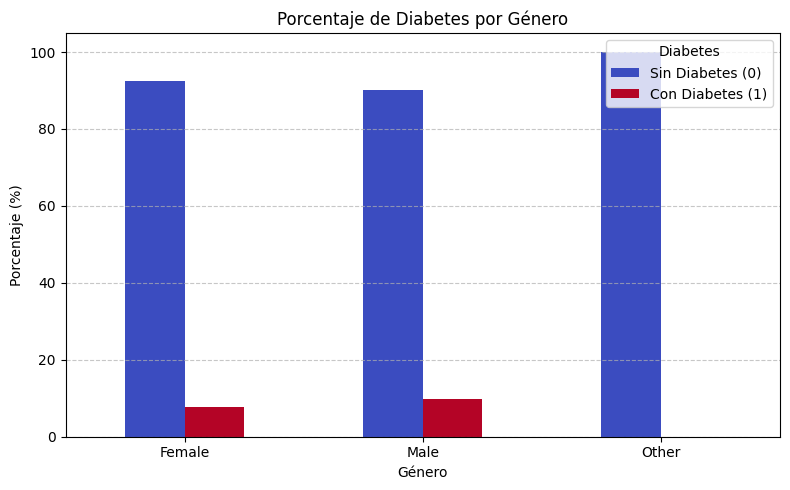

In [19]:
import pandas as pd
import matplotlib.pyplot as plt


conteo = df_cleaned.groupby(['gender', 'diabetes']).size().unstack(fill_value=0)

porcentajes = conteo.div(conteo.sum(axis=1), axis=0) * 100

# Paso 3: Graficar
porcentajes.plot(kind='bar', stacked=False, figsize=(8, 5), colormap='coolwarm')
plt.title('Porcentaje de Diabetes por Género')
plt.ylabel('Porcentaje (%)')
plt.xlabel('Género')
plt.legend(['Sin Diabetes (0)', 'Con Diabetes (1)'], title='Diabetes')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [20]:
porcentajes

diabetes,0,1
gender,,
Female,92.381131,7.618869
Male,90.251026,9.748974
Other,100.000000,0.000000


### Age y diabetes

C:\Users\alfre\AppData\Local\Temp\ipykernel_31156\4234301423.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  porcentaje_por_edad = df_cleaned.groupby('age_group')['diabetes'].mean() * 100


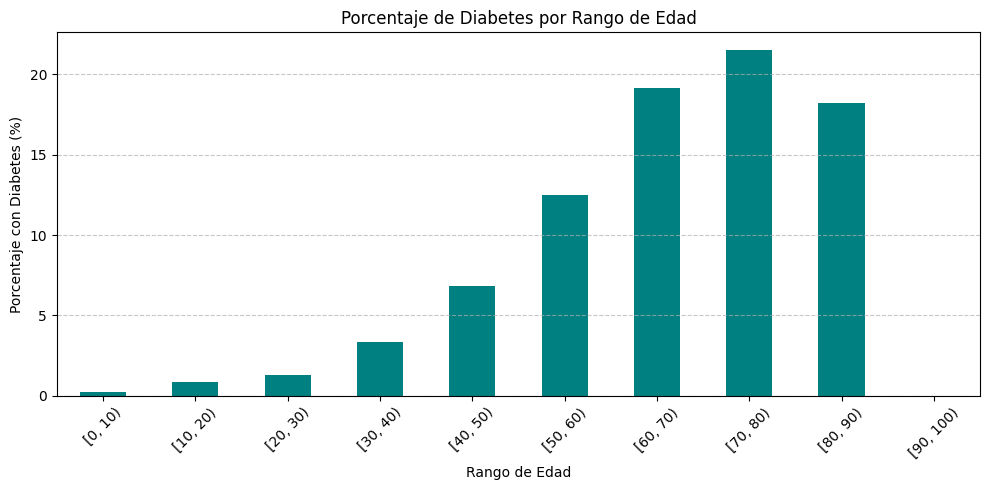

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Crear rangos de edad
df_cleaned['age_group'] = pd.cut(df_cleaned['age'], bins=range(0, 101, 10), right=False)

# Calcular porcentaje de diabetes por grupo de edad
porcentaje_por_edad = df_cleaned.groupby('age_group')['diabetes'].mean() * 100

# Graficar
porcentaje_por_edad.plot(kind='bar', figsize=(10, 5), color='teal')
plt.title('Porcentaje de Diabetes por Rango de Edad')
plt.ylabel('Porcentaje con Diabetes (%)')
plt.xlabel('Rango de Edad')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [22]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype   
---  ------               --------------   -----   
 0   gender               100000 non-null  object  
 1   age                  100000 non-null  float64 
 2   hypertension         100000 non-null  int64   
 3   heart_disease        100000 non-null  int64   
 4   bmi                  100000 non-null  float64 
 5   HbA1c_level          100000 non-null  float64 
 6   blood_glucose_level  100000 non-null  int64   
 7   diabetes             100000 non-null  int64   
 8   age_group            100000 non-null  category
dtypes: category(1), float64(3), int64(4), object(1)
memory usage: 6.2+ MB


#### Nivel de glucosa en la sangre

<Axes: >

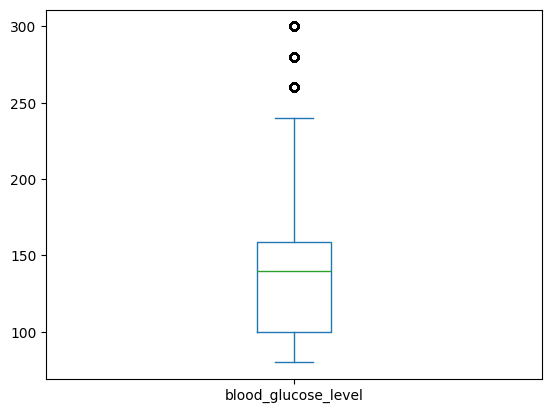

In [23]:
df_cleaned['blood_glucose_level'].plot(kind='box')

In [24]:
df_cleaned[df_cleaned['blood_glucose_level']==df_cleaned['blood_glucose_level'].max()]

,gender,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes,age_group
94,Female,60.0,0,0,27.32,7.5,300,1,"[60, 70)"
142,Female,80.0,0,0,21.97,7.0,300,1,"[80, 90)"
199,Female,43.0,0,0,26.71,6.5,300,1,"[40, 50)"
746,Male,62.0,0,0,32.19,5.8,300,1,"[60, 70)"
936,Male,49.0,0,0,27.32,6.5,300,1,"[40, 50)"
...,...,...,...,...,...,...,...,...,...
99663,Male,80.0,0,0,34.00,9.0,300,1,"[80, 90)"
99708,Male,62.0,0,0,27.32,6.0,300,1,"[60, 70)"
99826,Male,63.0,0,1,27.32,6.6,300,1,"[60, 70)"
99867,Male,64.0,1,0,33.12,5.7,300,1,"[60, 70)"


C:\Users\alfre\AppData\Local\Temp\ipykernel_31156\1001790351.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  porcentaje_por_glucosa = df_cleaned.groupby('glucose_group')['diabetes'].mean() * 100


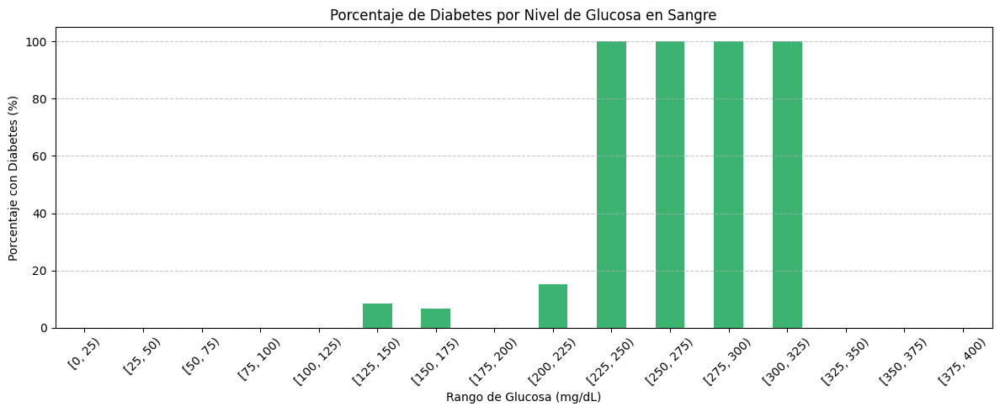

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

df_cleaned['glucose_group'] = pd.cut(df_cleaned['blood_glucose_level'], bins=range(0, 401, 25), right=False)

porcentaje_por_glucosa = df_cleaned.groupby('glucose_group')['diabetes'].mean() * 100

porcentaje_por_glucosa.plot(kind='bar', figsize=(12, 5), color='mediumseagreen')
plt.title('Porcentaje de Diabetes por Nivel de Glucosa en Sangre')
plt.ylabel('Porcentaje con Diabetes (%)')
plt.xlabel('Rango de Glucosa (mg/dL)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Matriz de correlacion!

In [27]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 10 columns):
 #   Column               Non-Null Count   Dtype   
---  ------               --------------   -----   
 0   gender               100000 non-null  object  
 1   age                  100000 non-null  float64 
 2   hypertension         100000 non-null  int64   
 3   heart_disease        100000 non-null  int64   
 4   bmi                  100000 non-null  float64 
 5   HbA1c_level          100000 non-null  float64 
 6   blood_glucose_level  100000 non-null  int64   
 7   diabetes             100000 non-null  int64   
 8   age_group            100000 non-null  category
 9   glucose_group        100000 non-null  category
dtypes: category(2), float64(3), int64(4), object(1)
memory usage: 6.3+ MB


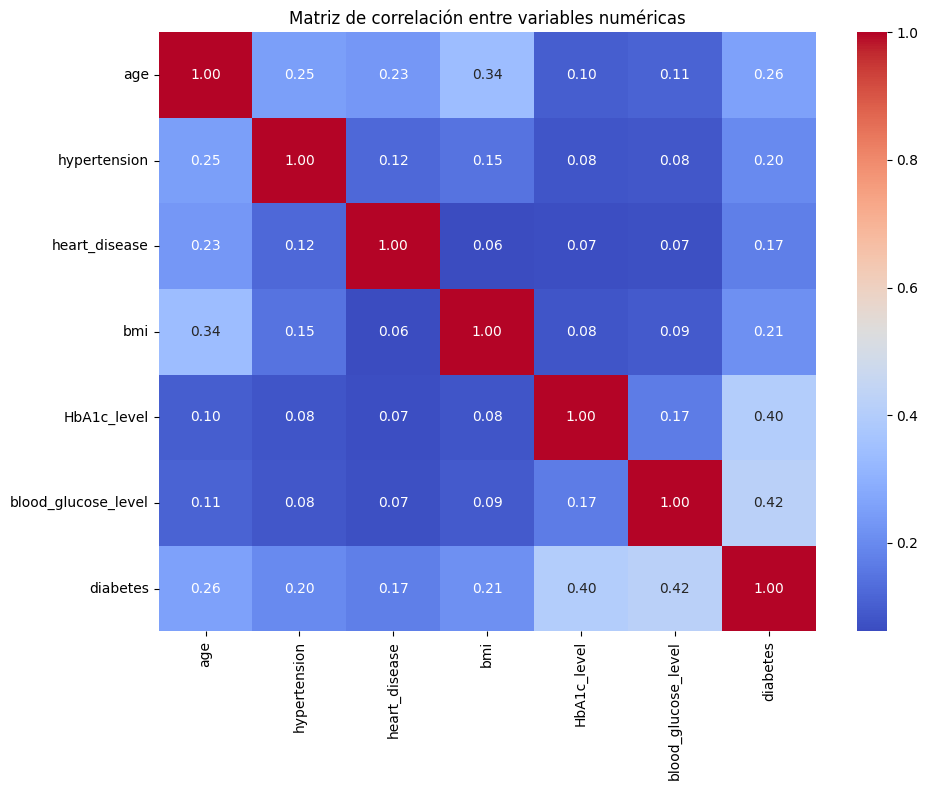

In [28]:
import seaborn as sns
numeric_df = df_cleaned.select_dtypes(include=['int64', 'float64'])

correlation_matrix = numeric_df.corr()

# Dibuja el heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Matriz de correlación entre variables numéricas')
plt.tight_layout()
plt.show()

In [29]:
df_cleaned.head()

,gender,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes,age_group,glucose_group
0,Female,80.0,0,1,25.19,6.6,140,0,"[80, 90)","[125, 150)"
1,Female,54.0,0,0,27.32,6.6,80,0,"[50, 60)","[75, 100)"
2,Male,28.0,0,0,27.32,5.7,158,0,"[20, 30)","[150, 175)"
3,Female,36.0,0,0,23.45,5.0,155,0,"[30, 40)","[150, 175)"
4,Male,76.0,1,1,20.14,4.8,155,0,"[70, 80)","[150, 175)"


### Diabetes y Hemoglobina glucosinada

C:\Users\alfre\AppData\Local\Temp\ipykernel_31156\897785121.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  porcentaje_por_hba1c = df_cleaned.groupby('hba1c_group')['diabetes'].mean() * 100


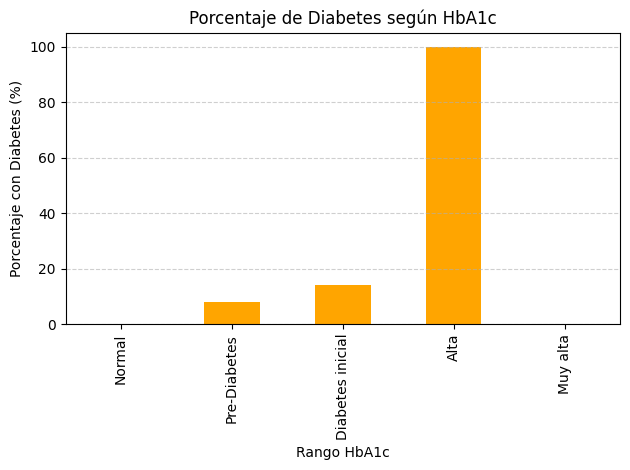

In [30]:
df_cleaned['hba1c_group'] = pd.cut(df_cleaned['HbA1c_level'], bins=[0, 5.6, 6.4, 7.0, 10, 20], labels=['Normal', 'Pre-Diabetes', 'Diabetes inicial', 'Alta', 'Muy alta'])

porcentaje_por_hba1c = df_cleaned.groupby('hba1c_group')['diabetes'].mean() * 100

porcentaje_por_hba1c.plot(kind='bar', color='orange', title='Porcentaje de Diabetes según HbA1c')
plt.ylabel('Porcentaje con Diabetes (%)')
plt.xlabel('Rango HbA1c')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [31]:
df_cleaned[(df_cleaned['HbA1c_level'] >= 0) & ( df_cleaned['HbA1c_level'] <= 5.6)]

,gender,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes,age_group,glucose_group,hba1c_group
3,Female,36.0,0,0,23.45,5.0,155,0,"[30, 40)","[150, 175)",Normal
4,Male,76.0,1,1,20.14,4.8,155,0,"[70, 80)","[150, 175)",Normal
8,Male,42.0,0,0,33.64,4.8,145,0,"[40, 50)","[125, 150)",Normal
9,Female,32.0,0,0,27.32,5.0,100,0,"[30, 40)","[100, 125)",Normal
12,Female,78.0,0,0,36.05,5.0,130,0,"[70, 80)","[125, 150)",Normal
...,...,...,...,...,...,...,...,...,...,...,...
99988,Male,19.0,0,0,25.75,5.0,145,0,"[10, 20)","[125, 150)",Normal
99989,Female,26.0,0,0,27.32,5.0,158,0,"[20, 30)","[150, 175)",Normal
99993,Female,40.0,0,0,40.69,3.5,155,0,"[40, 50)","[150, 175)",Normal
99994,Female,36.0,0,0,24.60,4.8,145,0,"[30, 40)","[125, 150)",Normal


### Datos segun

| Categoría                  | Nivel de HbA1c (%) |
| -------------------------- | ------------------ |
| **Normal (no diabético)**  | **Menor a 5.7%**   |
| **Pre-diabetes**           | **5.7% a 6.4%**    |
| **Diabetes diagnosticada** | **6.5% o más**     |
| **Mal control diabético**  | **> 7.0%**         |


## ------------------------------------------------------------------------------------------

# Feature engineering

#### Podemos ver que tenemos una variable que es tipo object (gender). Por lo cual debemos aplicar feature engineering y convertir los datos de tipo object a numerico, esto para realizar nuestro modelado.

In [33]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype   
---  ------               --------------   -----   
 0   gender               100000 non-null  object  
 1   age                  100000 non-null  float64 
 2   hypertension         100000 non-null  int64   
 3   heart_disease        100000 non-null  int64   
 4   bmi                  100000 non-null  float64 
 5   HbA1c_level          100000 non-null  float64 
 6   blood_glucose_level  100000 non-null  float64 
 7   diabetes             100000 non-null  int64   
 8   age_group            100000 non-null  category
 9   glucose_group        100000 non-null  category
 10  hba1c_group          100000 non-null  category
dtypes: category(3), float64(4), int64(3), object(1)
memory usage: 6.4+ MB


### Conteo de tipos de genero


In [34]:
print(df_cleaned['gender'].unique())

['Female' 'Male' 'Other']


In [35]:
df_cleaned['gender'].value_counts()

gender
Female    58552
Male      41430
Other        18
Name: count, dtype: int64

### - Entonces aplicamos un poco de feature engineering

#### -- Convertimos Male: 1  Female: 0  Other: 2 . En otras palabras pasamos de datos tipo object a datos numericos

In [36]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(df_cleaned.gender)
le.classes_

array(['Female', 'Male', 'Other'], dtype=object)

In [37]:
df_cleaned.gender = le.transform(df_cleaned.gender)

In [38]:
df_cleaned['gender'].value_counts()

gender
0    58552
1    41430
2       18
Name: count, dtype: int64

In [39]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype   
---  ------               --------------   -----   
 0   gender               100000 non-null  int64   
 1   age                  100000 non-null  float64 
 2   hypertension         100000 non-null  int64   
 3   heart_disease        100000 non-null  int64   
 4   bmi                  100000 non-null  float64 
 5   HbA1c_level          100000 non-null  float64 
 6   blood_glucose_level  100000 non-null  float64 
 7   diabetes             100000 non-null  int64   
 8   age_group            100000 non-null  category
 9   glucose_group        100000 non-null  category
 10  hba1c_group          100000 non-null  category
dtypes: category(3), float64(4), int64(4)
memory usage: 6.4 MB


### Normalizacion de variables

| Columna               | Tipo              | ¿Normalizar? | Justificación                                                                |
| --------------------- | ----------------- | ------------ | ---------------------------------------------------------------------------- |
| `age`                 | Numérica continua | ✅ Sí         | Varía desde 0 hasta 80+; importante escalar para modelos sensibles a escala. |
| `bmi`                 | Numérica continua | ✅ Sí         | Varía significativamente (ej. 17–35); afecta modelos como KNN o redes.       |
| `HbA1c_level`         | Numérica continua | ✅ Sí         | Aunque menor rango (ej. 4.0–6.6), igual importante escalar.                  |
| `blood_glucose_level` | Numérica continua | ✅ Sí         | Varía ampliamente (ej. 80–158); importante para convergencia del modelo.     |


| Columna           | Tipo             | ¿Normalizar? | Justificación                                                        |
| ----------------- | ---------------- | ------------ | -------------------------------------------------------------------- |
| `gender`          | Categórica       | ❌ No         | Se debe codificar (ej. one-hot o label encoding), **no** normalizar. |
| `hypertension`    | Binaria (0/1)    | ❌ No         | Ya está en formato binario; no requiere normalización.               |
| `heart_disease`   | Binaria (0/1)    | ❌ No         | Igual que arriba.                                                    |
| `smoking_history` | Categórica       | ❌ No         | Se debe codificar (ej. one-hot), no normalizar.                      |
| `diabetes`        | Etiqueta binaria | ❌ No         | Es la variable objetivo (0/1), no se normaliza.                      |


In [40]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df_cleaned[['bmi', 'HbA1c_level', 'blood_glucose_level', 'age']] = scaler.fit_transform(
    df_cleaned[['bmi', 'HbA1c_level', 'blood_glucose_level', 'age']]
)
df_cleaned

,gender,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes,age_group,glucose_group,hba1c_group
0,0,1.000000,0,1,0.177171,0.563636,0.272727,0,"[80, 90)","[125, 150)",Diabetes inicial
1,0,0.674675,0,0,0.202031,0.563636,0.000000,0,"[50, 60)","[75, 100)",Diabetes inicial
2,1,0.349349,0,0,0.202031,0.400000,0.354545,0,"[20, 30)","[150, 175)",Pre-Diabetes
3,0,0.449449,0,0,0.156863,0.272727,0.340909,0,"[30, 40)","[150, 175)",Normal
4,1,0.949950,1,1,0.118231,0.236364,0.340909,0,"[70, 80)","[150, 175)",Normal
...,...,...,...,...,...,...,...,...,...,...,...
99995,0,1.000000,0,0,0.202031,0.490909,0.045455,0,"[80, 90)","[75, 100)",Pre-Diabetes
99996,0,0.024024,0,0,0.085901,0.545455,0.090909,0,"[0, 10)","[100, 125)",Diabetes inicial
99997,1,0.824825,0,0,0.207983,0.400000,0.340909,0,"[60, 70)","[150, 175)",Pre-Diabetes
99998,0,0.299299,0,0,0.296569,0.090909,0.090909,0,"[20, 30)","[100, 125)",Normal


#### Creo que es momento de pasar a crear el modelo....

## ---------------------------------------------------------------------------------------

# Modelado 

#### 1.-Creacion de las variables predictoras y el target 

- Mostramos previamente nuestra df_cleaned con todos los datos limpios y listos

In [41]:
df_cleaned.head()

,gender,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes,age_group,glucose_group,hba1c_group
0,0,1.000000,0,1,0.177171,0.563636,0.272727,0,"[80, 90)","[125, 150)",Diabetes inicial
1,0,0.674675,0,0,0.202031,0.563636,0.000000,0,"[50, 60)","[75, 100)",Diabetes inicial
2,1,0.349349,0,0,0.202031,0.400000,0.354545,0,"[20, 30)","[150, 175)",Pre-Diabetes
3,0,0.449449,0,0,0.156863,0.272727,0.340909,0,"[30, 40)","[150, 175)",Normal
4,1,0.949950,1,1,0.118231,0.236364,0.340909,0,"[70, 80)","[150, 175)",Normal


- Nuestros datos estan listos para el modelado 

#### Separamos los datos en variables predictoras y variable objetivo

In [593]:
#var_predict = list(set(df_cleaned.columns) - set(['final_result']))
#target = df_cleaned['final_result']

In [42]:
var_predict = [	'gender', 'age', 'hypertension', 'heart_disease', 'bmi', 'HbA1c_level','blood_glucose_level']
target = df_cleaned['diabetes']


In [43]:
var_predict

['gender',
 'age',
 'hypertension',
 'heart_disease',
 'bmi',
 'HbA1c_level',
 'blood_glucose_level']

In [44]:
target

0        0
1        0
2        0
3        0
4        0
        ..
99995    0
99996    0
99997    0
99998    0
99999    0
Name: diabetes, Length: 100000, dtype: int64

In [45]:
x = df_cleaned[var_predict]
y = target

In [46]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=369)


In [47]:
from sklearn.linear_model import LogisticRegression
reg = LogisticRegression(class_weight='balanced')
reg.fit(x_train, y_train)
reg.get_params()

{'C': 1.0,
 'class_weight': 'balanced',
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [48]:
reg.coef_

array([[ 0.2796924 ,  3.94635101,  0.8757502 ,  0.84919218,  8.13882148,
        11.59789211,  6.84426143]])

In [49]:
y_pred = reg.predict(x_test)
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8866
Confusion Matrix:
 [[16288  2055]
 [  213  1444]]
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.89      0.93     18343
           1       0.41      0.87      0.56      1657

    accuracy                           0.89     20000
   macro avg       0.70      0.88      0.75     20000
weighted avg       0.94      0.89      0.90     20000



In [50]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(class_weight='balanced')
dtc.fit(x_train, y_train)

DecisionTreeClassifier(class_weight='balanced')

In [51]:
dtc.get_params()

{'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': None,
 'splitter': 'best'}

In [52]:
dtc.feature_importances_, dtc.feature_names_in_

(array([0.00880355, 0.13650416, 0.00684322, 0.00507846, 0.12080013,
        0.41217469, 0.30979578]),
 array(['gender', 'age', 'hypertension', 'heart_disease', 'bmi',
        'HbA1c_level', 'blood_glucose_level'], dtype=object))

<BarContainer object of 7 artists>

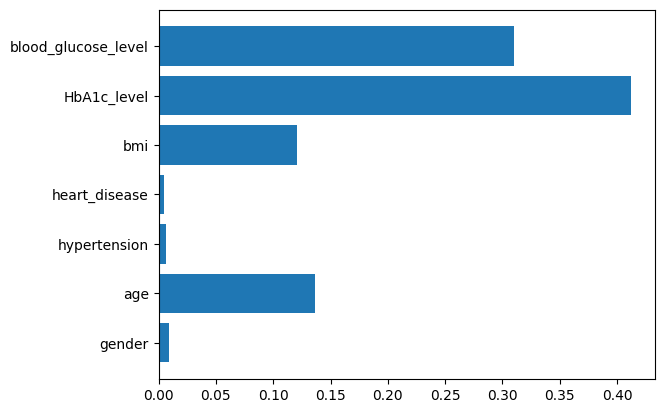

In [53]:
import matplotlib.pyplot as plt
plt.barh(dtc.feature_names_in_, dtc.feature_importances_)

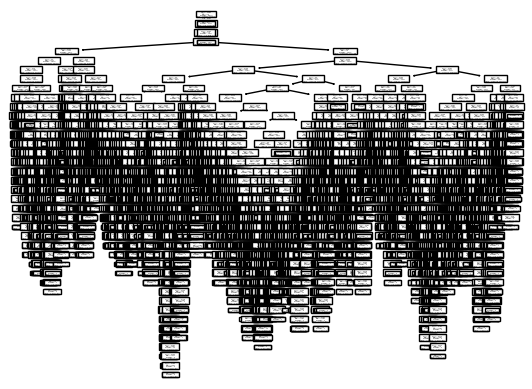

In [54]:
from sklearn.tree import plot_tree
plot_tree(dtc)
plt.show()

In [55]:
from sklearn.tree import export_graphviz
export_graphviz(dtc, out_file='dtc.dot')

In [56]:
import graphviz
with open('dtc.dot') as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

In [57]:
y_pred_dtc = dtc.predict(x_test)
from sklearn import metrics
metrics.accuracy_score(y_test, y_pred_dtc )

0.95235

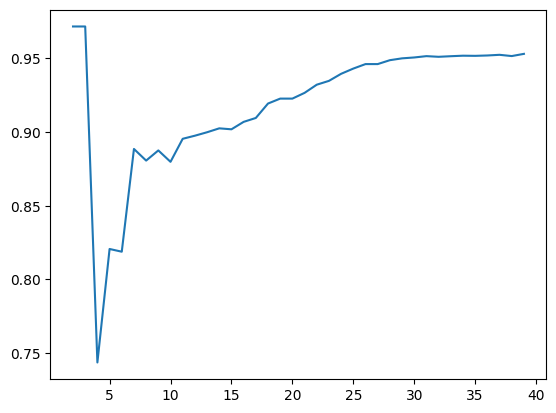

In [58]:
#obtener el mejora parametro
list_max_depth = list(range(2,40))
list_accuracy_score = list()
for i in list_max_depth:
    dtc = DecisionTreeClassifier(class_weight='balanced',max_depth=i)
    dtc.fit(x_train , y_train)
    y_pred_dtc = dtc.predict(x_test)
    list_accuracy_score.append(metrics.accuracy_score(y_test,y_pred_dtc))
plt.plot(list_max_depth,list_accuracy_score)

In [59]:
dtc = DecisionTreeClassifier(class_weight='balanced',max_depth=7)
dtc.fit(x_train, y_train)
y_pred_dtc = dtc.predict(x_test)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_dtc))
print("Classification Report:\n", classification_report(y_test, y_pred_dtc))

Accuracy: 0.88855
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.89      0.94     18343
           1       0.42      0.91      0.58      1657

    accuracy                           0.89     20000
   macro avg       0.71      0.90      0.76     20000
weighted avg       0.94      0.89      0.91     20000



| Profundidad | Accuracy | Precision (Clase 1) | Recall (Clase 1) | F1-score (Clase 1) | Comentario clave                                                             |
| ----------- | -------- | ------------------- | ---------------- | ------------------ | ---------------------------------------------------------------------------- |
| **2**       | 0.97175  | 1.00                | 0.66             | 0.79               | Muy conservador: se equivoca poco, pero omite muchos casos con diabetes.     |
| **7**       | 0.88855  | 0.42                | **0.91**         | 0.58               | Detecta casi todos los casos con diabetes, pero con muchos falsos positivos. |
| **15**      | 0.90195  | 0.45                | 0.87             | 0.59               | Ligero descenso en recall, mejora un poco la precisión.                      |


| ¿Quiero minimizar falsos negativos (no perder casos de diabetes)? | Elige `max_depth = 7`  |
| ----------------------------------------------------------------- | ---------------------- |
| ¿Quiero mejor balance entre acertar y no alarmar en falso?        | Elige `max_depth = 15` |


#### MAX DEEP = 7
|        | Predicho 0 | Predicho 1 |
| ------ | ---------- | ---------- |
| Real 0 | TN ≈ 16262 | FP ≈ 2081  |
| Real 1 | FN ≈ 149   | TP ≈ 1508  |



#### MAX DEEP = 15
|        | Predicho 0 | Predicho 1 |
| ------ | ---------- | ---------- |
| Real 0 | TN ≈ 16564 | FP ≈ 1779  |
| Real 1 | FN ≈ 216   | TP ≈ 1441  |


<BarContainer object of 7 artists>

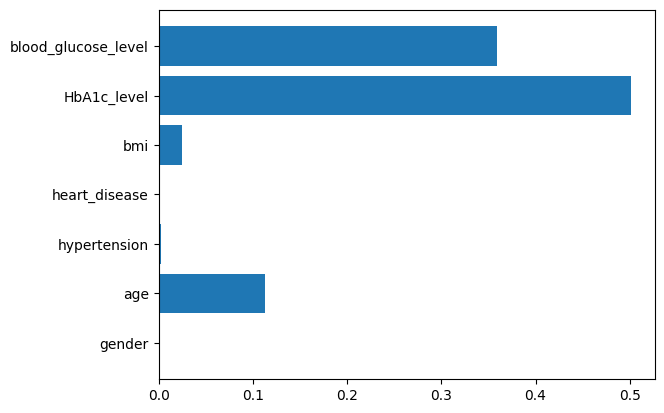

In [60]:
plt.barh(dtc.feature_names_in_, dtc.feature_importances_)

In [61]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(class_weight='balanced')
rfc.fit(x_train, y_train)
y_pred_rfc = rfc.predict(x_test)
metrics.accuracy_score(y_test, y_pred_rfc)

0.9676

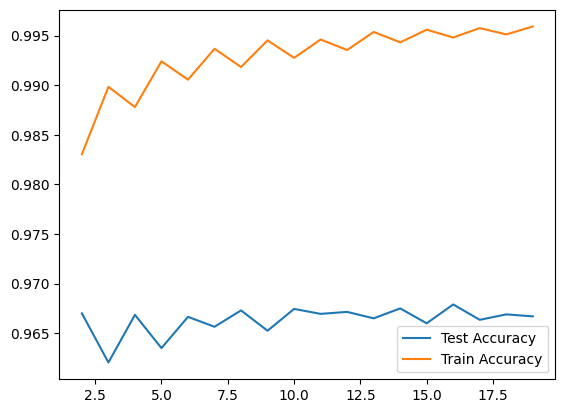

In [62]:
list_n_estimators = list(range(2, 20))
list_accuracy_score = []
list_accuracy_score_train = []

for i in list_n_estimators:
    rfc = RandomForestClassifier(class_weight='balanced',n_estimators=i)
    rfc.fit(x_train, y_train)

    y_pred_test = rfc.predict(x_test)
    list_accuracy_score.append(metrics.accuracy_score(y_test, y_pred_test))

    y_pred_train = rfc.predict(x_train)
    list_accuracy_score_train.append(metrics.accuracy_score(y_train, y_pred_train))

plt.plot(list_n_estimators, list_accuracy_score, label='Test Accuracy')
plt.plot(list_n_estimators, list_accuracy_score_train, label='Train Accuracy')
plt.legend()
plt.show()


In [63]:
rfc = RandomForestClassifier(class_weight='balanced',n_estimators=3)
rfc.fit(x_train, y_train)
y_pred_rfc = rfc.predict(x_test)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_rfc))
print("Classification Report:\n", classification_report(y_test, y_pred_rfc))

Accuracy: 0.9612
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.98     18343
           1       0.80      0.71      0.75      1657

    accuracy                           0.96     20000
   macro avg       0.89      0.85      0.87     20000
weighted avg       0.96      0.96      0.96     20000



In [64]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_rfc)
print("Matriz de confusión:")
print(cm)


Matriz de confusión:
[[18052   291]
 [  485  1172]]


In [65]:
from sklearn.svm import SVC
svc = SVC(class_weight='balanced')
svc.fit(x_train, y_train)
y_pred_svc = svc.predict(x_test)
metrics.accuracy_score(y_test, y_pred_svc)

0.88505

In [66]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_svc)
print("Matriz de confusión:")
print(cm)


Matriz de confusión:
[[16206  2137]
 [  162  1495]]


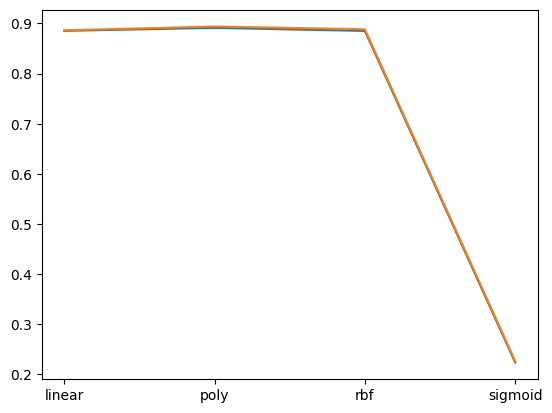

In [67]:
#optimiacion (c, kernel, gamma)
list_kernel = ["linear","poly","rbf","sigmoid"]
list_accuracy_score=list()
list_accuracy_score_train = list()
for i in list_kernel:
    svc = SVC(class_weight='balanced',kernel=i)
    svc.fit(x_train,y_train)
    y_pred_svm = svc.predict(x_test)
    list_accuracy_score.append(metrics.accuracy_score(y_test,y_pred_svm))

    y_pred_train = svc.predict(x_train)
    list_accuracy_score_train.append(metrics.accuracy_score(y_train,y_pred_train))

plt.plot(list_kernel,list_accuracy_score)
plt.plot(list_kernel, list_accuracy_score_train)

In [68]:
from sklearn.svm import SVC
svc = SVC(class_weight='balanced', kernel='linear')
svc.fit(x_train, y_train)
y_pred_svc = svc.predict(x_test)
metrics.accuracy_score(y_test, y_pred_svc)

0.8852

In [69]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_svc)
print("Matriz de confusión:")
print(cm)

Matriz de confusión:
[[16254  2089]
 [  207  1450]]


In [70]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(x_train, y_train)
y_pred_gnb = gnb.predict(x_test)
metrics.accuracy_score(y_test, y_pred_gnb)

0.9016

In [71]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred_gnb)
print("Matriz de confusión:")
print(cm)

Matriz de confusión:
[[16991  1352]
 [  616  1041]]


## Comparemos cual modelo es mejor!!

In [72]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
#from sklearn.svm import SVC

models_list_name = ["LogisticRegression", "DecisionTreeClassifier", "RandomForestClassifier"]
models_list_object = [LogisticRegression(class_weight='balanced'), DecisionTreeClassifier(class_weight='balanced',max_depth=7), RandomForestClassifier(class_weight='balanced',n_estimators=3)]
models_list_object

[LogisticRegression(class_weight='balanced'),
 DecisionTreeClassifier(class_weight='balanced', max_depth=7),
 RandomForestClassifier(class_weight='balanced', n_estimators=3)]

In [73]:
from sklearn import metrics
model_accuracy_list = list()
for model in models_list_object:
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    model_accuracy_list.append(metrics.accuracy_score(y_test, y_pred))

### Accuracy de cada modelo

In [74]:
pd.DataFrame({"Models" :models_list_name, "accuracy":model_accuracy_list})

,Models,accuracy
0,LogisticRegression,0.88660
1,DecisionTreeClassifier,0.88855
2,RandomForestClassifier,0.96235


### Analisemos logistic Regresion

In [75]:
model = LogisticRegression(class_weight='balanced')
model.fit(x_train, y_train)
y_pred_logistic = model.predict(x_test)
metrics.accuracy_score(y_test, y_pred_logistic)

0.8866

- Podemos ver una precision del 0.88% y una FP 2055 numero elevado pero FN 213 moderado por asi decirlo

In [76]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred_logistic)

array([[16288,  2055],
       [  213,  1444]])

### Analisemos DecisionTreeClassifier

In [77]:
model1 = DecisionTreeClassifier(max_depth=7, class_weight='balanced')
model1.fit(x_train,y_train)
y_pred_decision_tree = model1.predict(x_test)
metrics.accuracy_score(y_test, y_pred_decision_tree)

0.88855

- Podemos ver una precision de 0.88% y una FP 2081 numero elevado pero FN 148 muy moderado 

In [78]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred_decision_tree)

array([[16262,  2081],
       [  148,  1509]])

### Analisemos RandomForestClassifier

In [79]:
model2 = RandomForestClassifier(n_estimators=3, class_weight='balanced')
model2.fit(x_train,y_train)
y_pred_random_forest = model2.predict(x_test)
metrics.accuracy_score(y_test, y_pred_random_forest)

0.9621

- Podemos ver una precision de 96% (muy precisa). No obstante, FN son de 502(mucho mas que los demas ) y FP de 256 (moderado)

In [80]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred_random_forest)

array([[18087,   256],
       [  502,  1155]])

### Esta muy pareja la decision, pero tenemos dos contendientes RandomForest o DecisionTree. RandomForest cuenta con un acuraccy de 96% pero tiene 496 FN. Por otro lado tenemos DecisionTree, este tiene un acuraccy del 88% pero solo 148 FN lo cual es bastante bueno. Como queremos reducir los FN, nuestro modelo ganador es DecisionTree.

## Modelo ganador Decision Tree!

In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

df = pd.read_csv('diabetes_prediction_dataset.csv')
df_cleaned = df.copy()

In [82]:
df_cleaned.info

<bound method DataFrame.info of        gender   age  hypertension  heart_disease smoking_history    bmi  \
0      Female  80.0             0              1           never  25.19   
1      Female  54.0             0              0         No Info  27.32   
2        Male  28.0             0              0           never  27.32   
3      Female  36.0             0              0         current  23.45   
4        Male  76.0             1              1         current  20.14   
...       ...   ...           ...            ...             ...    ...   
99995  Female  80.0             0              0         No Info  27.32   
99996  Female   2.0             0              0         No Info  17.37   
99997    Male  66.0             0              0          former  27.83   
99998  Female  24.0             0              0           never  35.42   
99999  Female  57.0             0              0         current  22.43   

       HbA1c_level  blood_glucose_level  diabetes  
0              

In [83]:
df_cleaned.drop(columns=["smoking_history"], inplace=True)
df_cleaned

,gender,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,25.19,6.6,140,0
1,Female,54.0,0,0,27.32,6.6,80,0
2,Male,28.0,0,0,27.32,5.7,158,0
3,Female,36.0,0,0,23.45,5.0,155,0
4,Male,76.0,1,1,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...
99995,Female,80.0,0,0,27.32,6.2,90,0
99996,Female,2.0,0,0,17.37,6.5,100,0
99997,Male,66.0,0,0,27.83,5.7,155,0
99998,Female,24.0,0,0,35.42,4.0,100,0


In [84]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(df_cleaned.gender)
le.classes_

array(['Female', 'Male', 'Other'], dtype=object)

In [85]:
df_cleaned.gender = le.transform(df_cleaned.gender)
df_cleaned

,gender,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,25.19,6.6,140,0
1,0,54.0,0,0,27.32,6.6,80,0
2,1,28.0,0,0,27.32,5.7,158,0
3,0,36.0,0,0,23.45,5.0,155,0
4,1,76.0,1,1,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...
99995,0,80.0,0,0,27.32,6.2,90,0
99996,0,2.0,0,0,17.37,6.5,100,0
99997,1,66.0,0,0,27.83,5.7,155,0
99998,0,24.0,0,0,35.42,4.0,100,0


In [86]:
var_predict = [	'gender', 'age', 'hypertension', 'heart_disease', 'bmi', 'HbA1c_level','blood_glucose_level']
target = df_cleaned['diabetes']

In [87]:
x = df_cleaned[var_predict]
y = target

In [88]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=369)

In [89]:

from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
model_final = DecisionTreeClassifier(max_depth=7, class_weight='balanced')
model_final.fit(x_train,y_train)
y_pred_decision_tree = model_final.predict(x_test)
metrics.accuracy_score(y_test, y_pred_decision_tree)

0.88855

In [90]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred_decision_tree)

array([[16262,  2081],
       [  148,  1509]])

<Axes: >

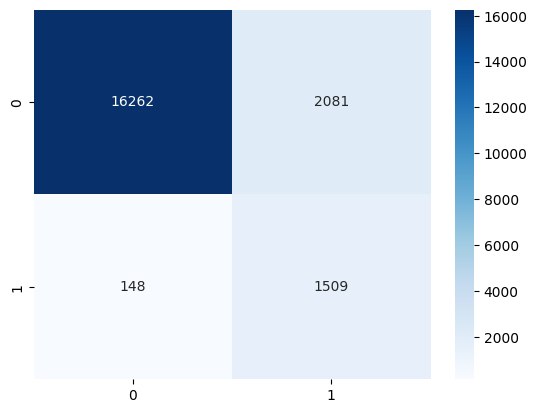

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.heatmap(confusion_matrix(y_test, y_pred_decision_tree), annot=True, fmt="d", cmap="Blues")

In [92]:
from sklearn.metrics import accuracy_score, classification_report
print("Accuracy:", metrics.accuracy_score(y_test, y_pred_decision_tree))
print("Classification Report:\n", classification_report(y_test, y_pred_decision_tree))

Accuracy: 0.88855
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.89      0.94     18343
           1       0.42      0.91      0.58      1657

    accuracy                           0.89     20000
   macro avg       0.71      0.90      0.76     20000
weighted avg       0.94      0.89      0.91     20000



In [93]:
p_pred = model_final.predict_proba(x_test)
p_pred = p_pred[:,1]   

In [94]:
p_pred

array([0.        , 0.07849311, 0.61989753, ..., 0.        , 0.        ,
       0.        ], shape=(20000,))

In [95]:
from sklearn.metrics import roc_curve, roc_auc_score
fpr, tpr, thresholds = roc_curve(y_test, p_pred, pos_label=1)
fpr, tpr, thresholds

(array([0.        , 0.        , 0.02425994, 0.02573189, 0.0453579 ,
        0.11344927, 0.13323884, 0.21354195, 0.22357303, 0.40582238,
        1.        ]),
 array([0.        , 0.65902233, 0.77066989, 0.77066989, 0.8044659 ,
        0.91068196, 0.92637296, 0.97887749, 0.97948099, 1.        ,
        1.        ]),
 array([       inf, 1.        , 0.79508974, 0.65562809, 0.63619245,
        0.61989753, 0.4725708 , 0.38074395, 0.10423339, 0.07849311,
        0.        ]))

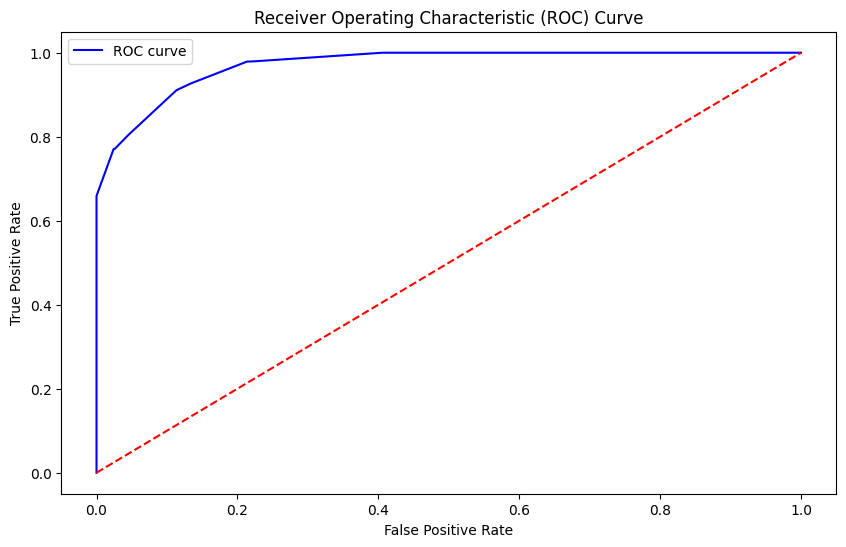

In [96]:
fig = plt.figure(figsize=(10, 6))
plt.plot(fpr,tpr, color='blue', label='ROC curve')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
#-------------------------------------------------------------
plt.show()

In [97]:
auc = roc_auc_score(y_test, p_pred)
auc

np.float64(0.971382149268461)